In [111]:
import requests
import pandas as pd
import numpy as np 
from build_parallel_route import *
from build_sequential_route import *
import warnings
warnings.filterwarnings('ignore')

#fixed global parameters 

NUM_STOPS = 4 
COVERAGE_RADIUS = 1500
GEO_COVERAGE_PROP = 0.5
ORIGIN = 42428368 #only for the sequential model

#### Parallel Routing

In [114]:
parallel_route_models = dict()
alphas = np.arange(0,1.05,0.05)

for alpha in alphas: 
    model = ParallelRouteOptimation(
        alpha=alpha,
        num_stops=NUM_STOPS, 
        coverage_radius=COVERAGE_RADIUS,
        geo_coverage_prop=GEO_COVERAGE_PROP
    )

    model.solve_problem()
    parallel_route_models[alpha] = model 


#model.build_route_parameters()
#model.plot_route()

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /opt/anaconda3/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/wx/wz1pbs1903j_cfgqws400dz80000gn/T/cce8dc464a6547bd818dabce655e9cb4-pulp.mps -max -timeMode elapsed -branch -printingOptions all -solution /var/folders/wx/wz1pbs1903j_cfgqws400dz80000gn/T/cce8dc464a6547bd818dabce655e9cb4-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 73 COLUMNS
At line 1460 RHS
At line 1529 BOUNDS
At line 1662 ENDATA
Problem MODEL has 68 rows, 132 columns and 1057 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is -3315.67 - 0.00 seconds
Cgl0004I processed model has 68 rows, 132 columns (132 integer (132 of which binary)) and 1057 elements
Cbc0038I Initial state - 19 integers unsatisfied sum - 5.84615
Cbc0038I Pass   1: suminf.    4.80000 (12) obj. 3330.99 iterations 23
Cbc0038I Solution f

*** SUMMARY STATISTICS ***
Demand Covered: 0.8584485380901887
Total System Time: 55.58837549254754 min
Average User System Time: 13.897093873136885 min
Upper Bound User Time in System: 14.304463908614773 min
Lower Bound User Time in System: 13.586130924788964 min


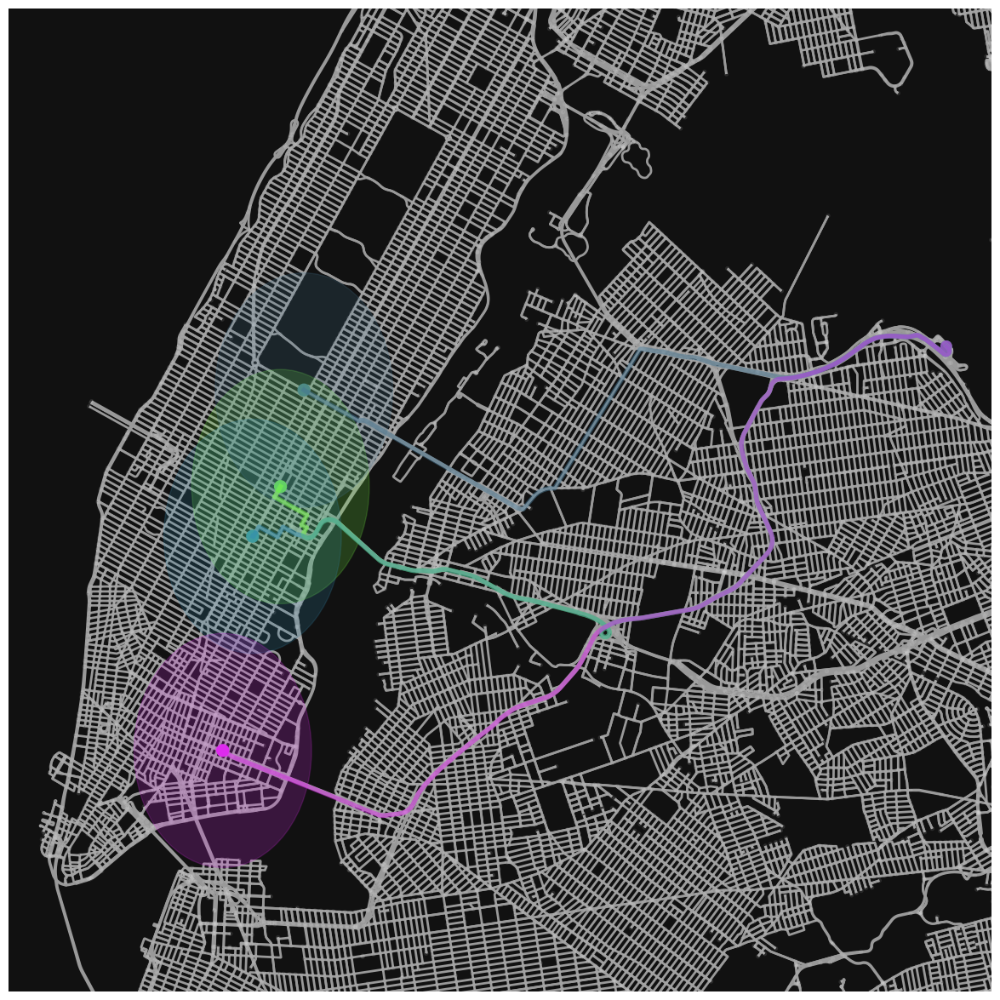

*** SUMMARY STATISTICS ***
Demand Covered: 0.9794614161596664
Total System Time: 60.307134459747616 min
Average User System Time: 15.076783614936904 min
Upper Bound User Time in System: 16.051812903501894 min
Lower Bound User Time in System: 14.250813317918006 min


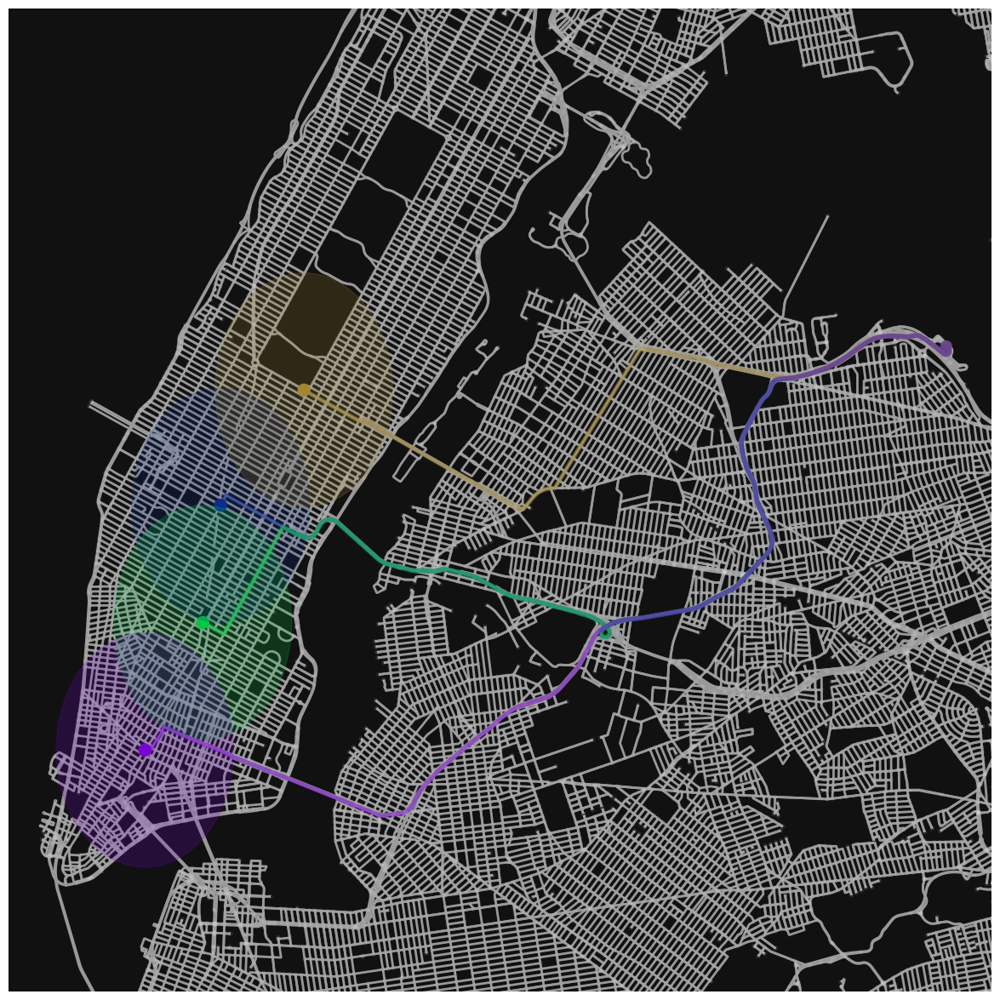

In [122]:
parallel_route_models[0.25].build_route_parameters()
parallel_route_models[0.25].plot_route()
parallel_route_models[0.75].build_route_parameters()
parallel_route_models[0.75].plot_route()

In [4]:
summary_stats = []
for alpha, m in parallel_route_models.items():
    stats = m.build_route_parameters()['Summary Statistics']
    #m.plot_route() 

    summary_stats.append(stats)

*** SUMMARY STATISTICS ***
Demand Covered: 0.8058904963198833
Total System Time: 55.31463471777633 min
Average User System Time: 13.828658679444082 min
Upper Bound User Time in System: 14.304463908614773 min
Lower Bound User Time in System: 13.415336451218169 min
*** SUMMARY STATISTICS ***
Demand Covered: 0.8058904963198833
Total System Time: 55.31463471777633 min
Average User System Time: 13.828658679444082 min
Upper Bound User Time in System: 14.304463908614773 min
Lower Bound User Time in System: 13.415336451218169 min
*** SUMMARY STATISTICS ***
Demand Covered: 0.8058904963198833
Total System Time: 55.31463471777633 min
Average User System Time: 13.828658679444082 min
Upper Bound User Time in System: 14.304463908614773 min
Lower Bound User Time in System: 13.415336451218169 min
*** SUMMARY STATISTICS ***
Demand Covered: 0.8584485380901887
Total System Time: 55.58837549254754 min
Average User System Time: 13.897093873136885 min
Upper Bound User Time in System: 14.304463908614773 min


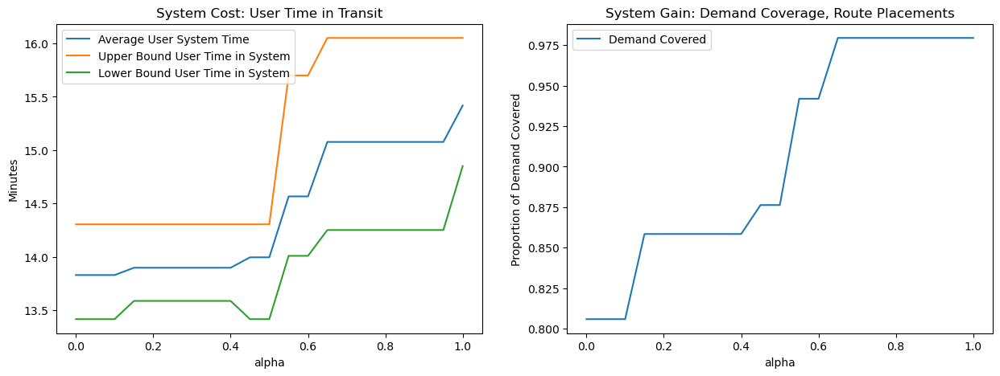

In [5]:
statistics_per_alpha = pd.DataFrame(summary_stats)
statistics_per_alpha['alpha'] = alphas 

statistics_per_alpha = statistics_per_alpha.set_index('alpha')
fig,ax = plt.subplots(1,2,figsize=(15,5))
statistics_per_alpha[[
    'Average User System Time', 
    'Upper Bound User Time in System', 
    'Lower Bound User Time in System'
]].plot(
    title='System Cost: User Time in Transit', 
    ax=ax[0]
)
ax[0].set_ylabel('Minutes')
statistics_per_alpha[['Demand Covered']].plot(
    title='System Gain: Demand Coverage, Route Placements', 
    ax=ax[1]
)
ax[1].set_ylabel('Proportion of Demand Covered')
plt.show()

In [6]:
tradeoff = (statistics_per_alpha/statistics_per_alpha.iloc[0])-1
tradeoff['delta'] = tradeoff['Demand Covered']-tradeoff['Total System Time']
tradeoff

,Demand Covered,Total System Time,Average User System Time,Upper Bound User Time in System,Lower Bound User Time in System,delta
alpha,,,,,,
0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
0.05,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
0.10,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
0.15,0.065217,0.004949,0.004949,0.000000,0.012731,0.060269
0.20,0.065217,0.004949,0.004949,0.000000,0.012731,0.060269
0.25,0.065217,0.004949,0.004949,0.000000,0.012731,0.060269
0.30,0.065217,0.004949,0.004949,0.000000,0.012731,0.060269
0.35,0.065217,0.004949,0.004949,0.000000,0.012731,0.060269
0.40,0.065217,0.004949,0.004949,0.000000,0.012731,0.060269


In [7]:
best_alpha_p = tradeoff['delta'].idxmax() 
best_alpha_p

0.65

#### Sequential Routing

In [9]:
sequential_route_models = dict()
alphas = np.arange(0,1.25,0.25)

for alpha in alphas: 
    model = SequentialRouteOptimization(
        alpha=alpha,
        num_stops=NUM_STOPS, 
        coverage_radius=COVERAGE_RADIUS,
        geo_coverage_prop=GEO_COVERAGE_PROP,
        origin_node_id=ORIGIN
    )

    model.solve_problem()
    sequential_route_models[alpha] = model 

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /opt/anaconda3/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/wx/wz1pbs1903j_cfgqws400dz80000gn/T/92dc795d39a14cddb949bfdab58b2293-pulp.mps -max -timeMode elapsed -branch -printingOptions all -solution /var/folders/wx/wz1pbs1903j_cfgqws400dz80000gn/T/92dc795d39a14cddb949bfdab58b2293-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 4495 COLUMNS
At line 99268 RHS
At line 103759 BOUNDS
At line 108182 ENDATA
Problem MODEL has 4490 rows, 4488 columns and 81638 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is -1144.37 - 0.02 seconds
Cgl0002I 65 variables fixed
Cgl0008I 66 inequality constraints converted to equality constraints
Cgl0004I processed model has 4360 rows, 4488 columns (4423 integer (4423 of which binary)) and 80599 elements
Cbc0038I Initial state - 50 integers u

*** SUMMARY STATISTICS ***
Demand Covered: 0.6285444269400317
Total System Time: 20.584779062089897
Average User System Time: 8.299729187985552
Upper Bound User Time in System: 20.584779062089897 min
Lower Bound User Time in System: 2.9287705060017135 min
[42453952, 42428444, 42428368, 1773076511]


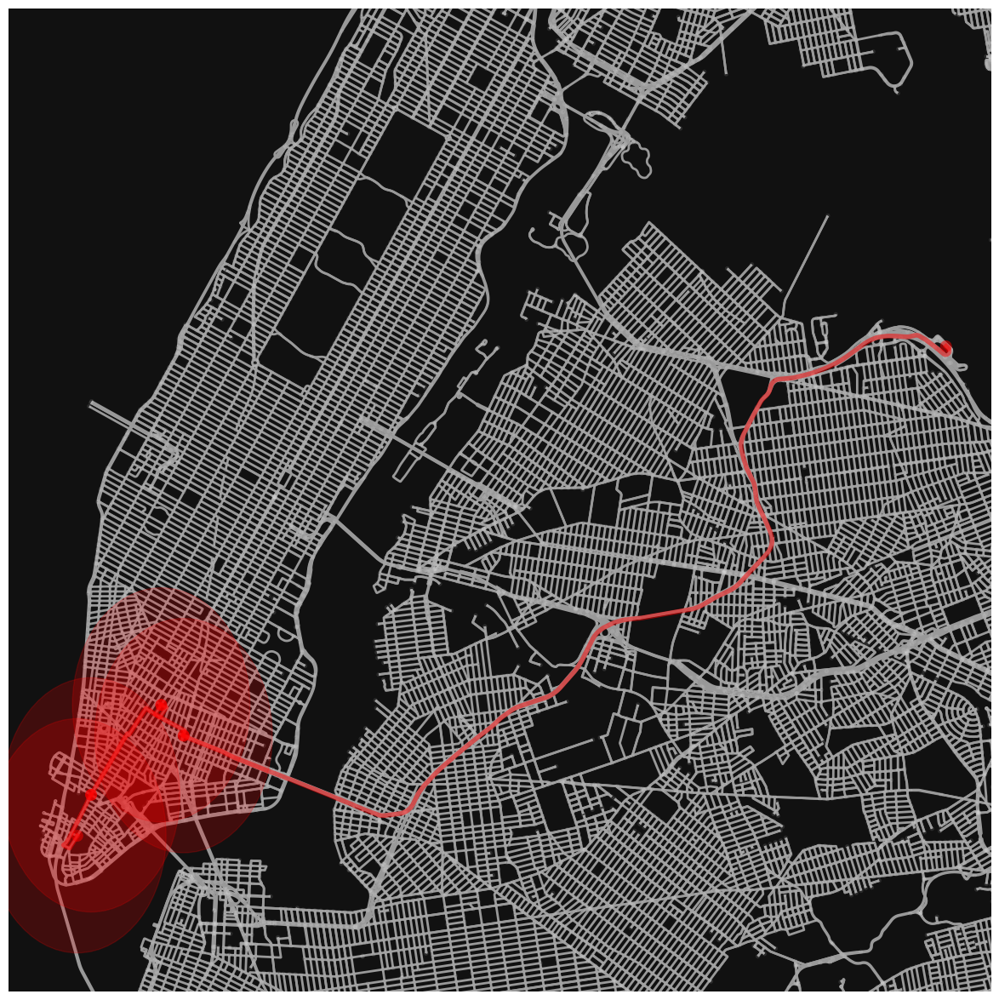

*** SUMMARY STATISTICS ***
Demand Covered: 0.8519333246917801
Total System Time: 22.758883992417047
Average User System Time: 16.27875475369968
Upper Bound User Time in System: 22.758883992417047 min
Lower Bound User Time in System: 3.513603656332221 min
[42453952, 42430304, 42430233, 42428368]


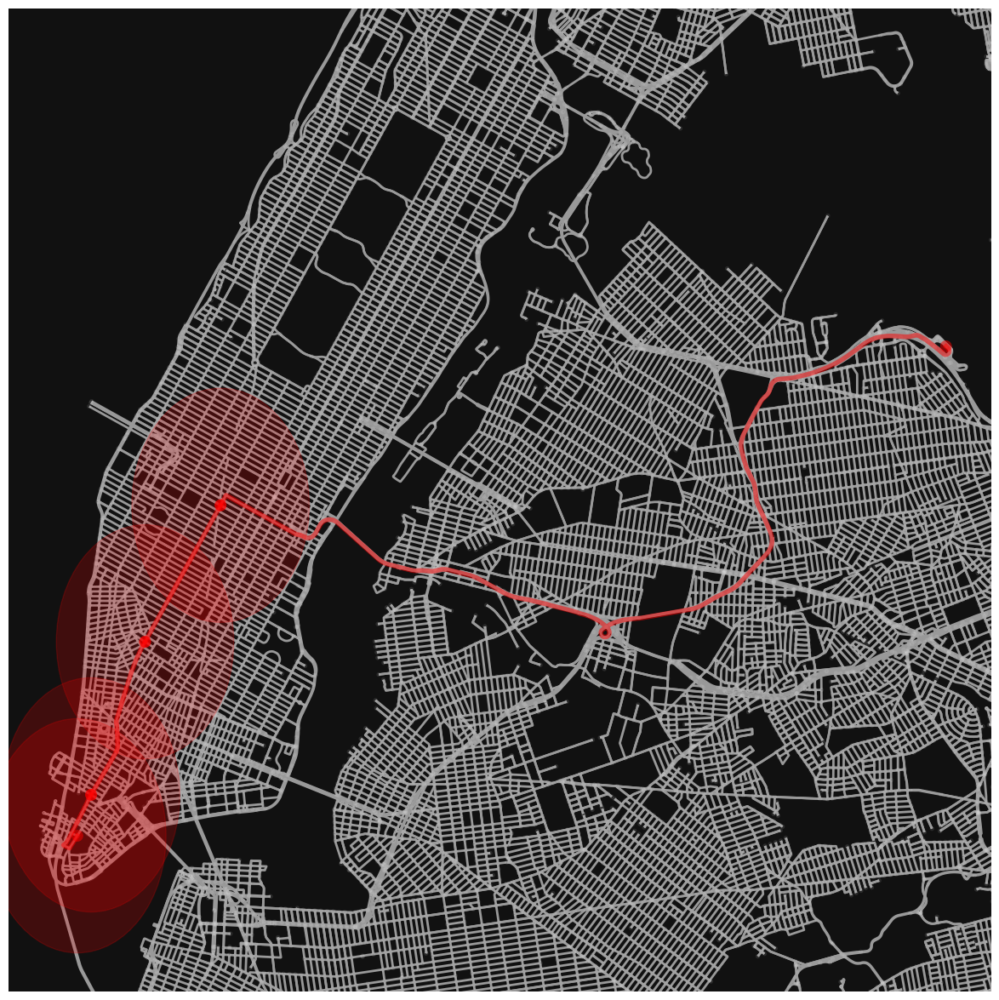

*** SUMMARY STATISTICS ***
Demand Covered: 0.8519333246917801
Total System Time: 22.758883992417047
Average User System Time: 16.27875475369968
Upper Bound User Time in System: 22.758883992417047 min
Lower Bound User Time in System: 3.513603656332221 min
[42453952, 42430304, 42430233, 42428368]


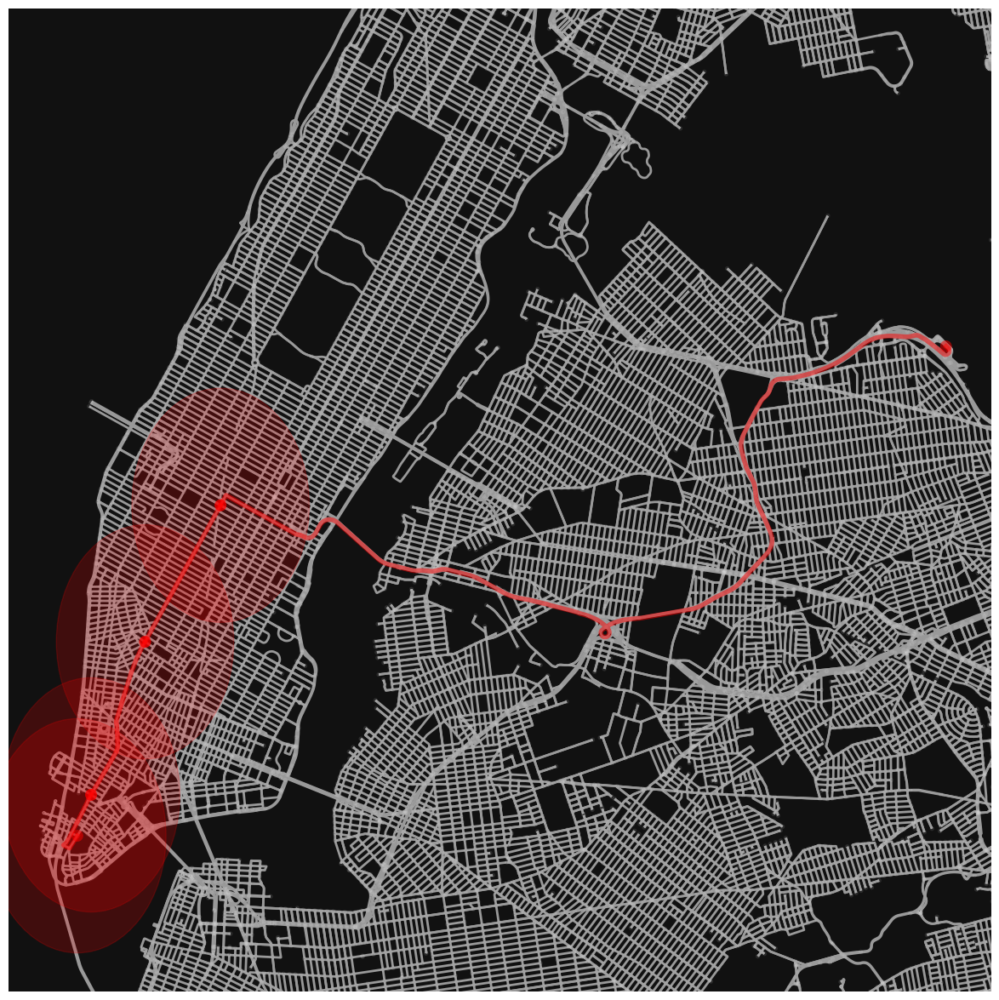

*** SUMMARY STATISTICS ***
Demand Covered: 0.9243406289718545
Total System Time: 26.110812711247323
Average User System Time: 19.73361452772691
Upper Bound User Time in System: 26.110812711247323 min
Lower Bound User Time in System: 14.304463908614773 min
[4347534767, 42430304, 42430233, 42428368]


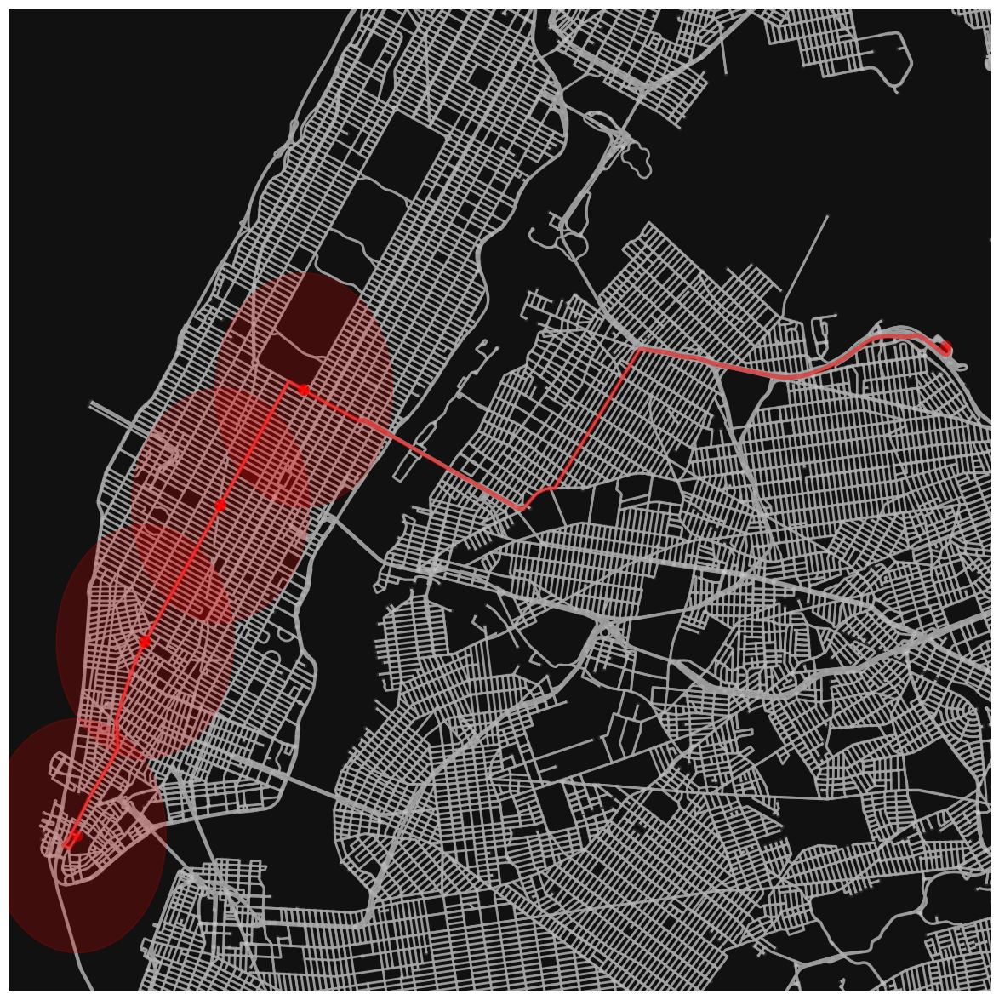

*** SUMMARY STATISTICS ***
Demand Covered: 0.9354945508317303
Total System Time: 35.03315024341069
Average User System Time: 19.645441620228887
Upper Bound User Time in System: 35.03315024341069 min
Lower Bound User Time in System: 4.609696399529201 min
[42437890, 42436700, 42428444, 42428368]


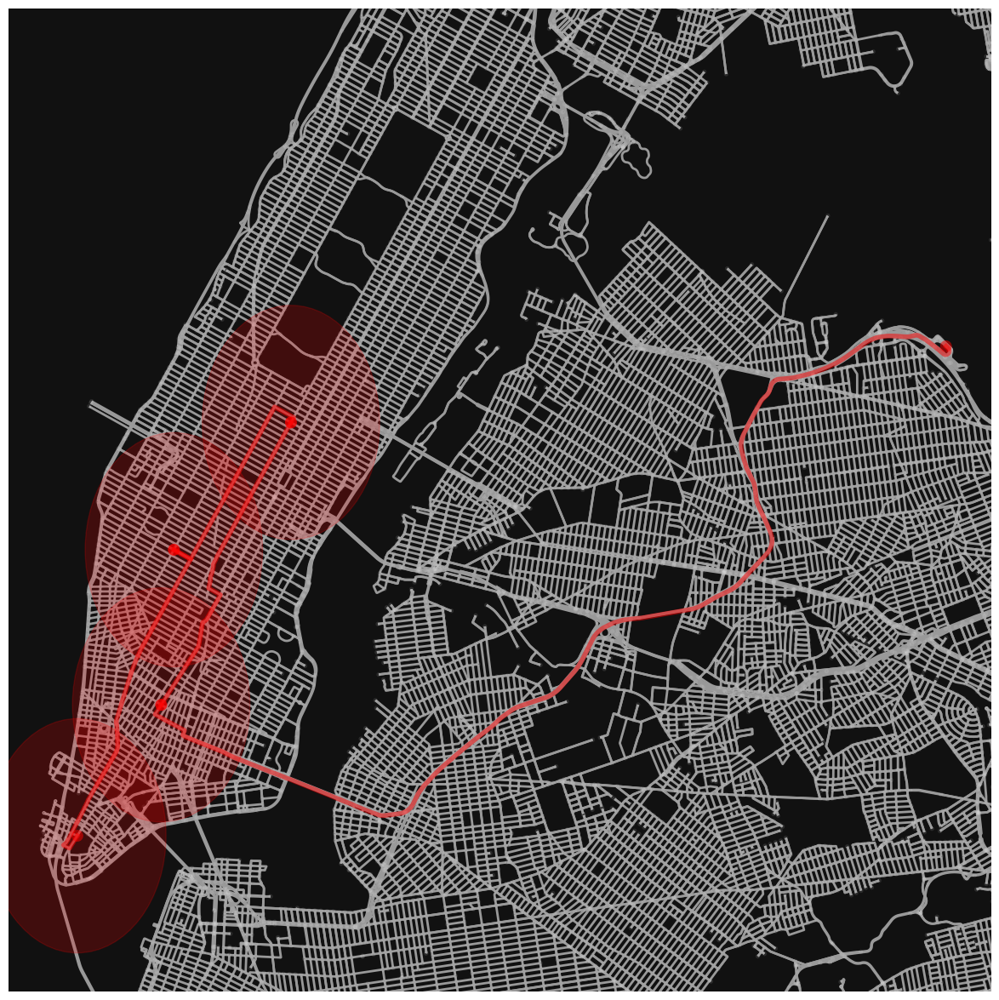

In [11]:
summary_stats_seq = []
for alpha, m in sequential_route_models.items():
    stats = m.build_route_parameters()['Summary Statistics']
    m.plot_route() 

    summary_stats_seq.append(stats)

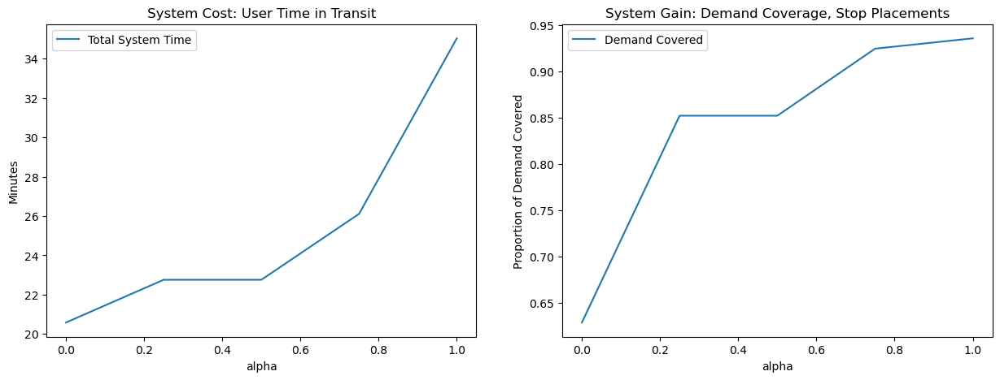

In [12]:
statistics_per_alpha = pd.DataFrame(summary_stats_seq)
statistics_per_alpha['alpha'] = np.arange(0,1.25,0.25)

statistics_per_alpha = statistics_per_alpha.set_index('alpha')
fig,ax = plt.subplots(1,2,figsize=(15,5))
statistics_per_alpha[[
    'Total System Time', 
]].plot(
    title='System Cost: User Time in Transit', 
    ax=ax[0]
)
ax[0].set_ylabel('Minutes')
statistics_per_alpha[['Demand Covered']].plot(
    title='System Gain: Demand Coverage, Stop Placements', 
    ax=ax[1]
)
ax[1].set_ylabel('Proportion of Demand Covered')
plt.show()

In [13]:
tradeoff = (statistics_per_alpha/statistics_per_alpha.iloc[0])-1
tradeoff['delta'] = tradeoff['Demand Covered'] - tradeoff['Total System Time']
tradeoff

,Demand Covered,Total System Time,Average User System Time,Upper Bound User Time in System,Lower Bound User Time in System,delta
alpha,,,,,,
0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
0.25,0.355407,0.105617,0.961360,0.105617,0.199686,0.249790
0.50,0.355407,0.105617,0.961360,0.105617,0.199686,0.249790
0.75,0.470605,0.268452,1.377621,0.268452,3.884119,0.202153
1.00,0.488351,0.701896,1.366998,0.701896,0.573936,-0.213545


In [14]:
best_alpha_seq = tradeoff['delta'].idxmax()
best_alpha_seq

0.25

#### Headways + Utilization Analysis

##### Scenario A

In [27]:
import requests
import sqlite3
import pandas as pd 
from utils import *

conn = sqlite3.connect('../data_playground/bus_locations_benchmark2.db')
ridership = pd.read_sql('''select * from q70ridership''',con=conn) 
by_hr = ridership.groupby(['hour'])['ridership'].median() 
by_hr = by_hr / by_hr.sum() 

demand_vector = get_demand_parameters()
distances_update = get_cost_matrix(weight_type = 'distance')

In [29]:
ridership.head()

,ridership,hour,day,dow,month,year
0,300.232,0,1,5,1,2022
1,3.758,1,1,5,1,2022
2,0.160,2,1,5,1,2022
3,2.976,3,1,5,1,2022
4,1.719,4,1,5,1,2022


*** SUMMARY STATISTICS ***
Demand Covered: 0.9794614161596664
Total System Time: 60.307134459747616 min
Average User System Time: 15.076783614936904 min
Upper Bound User Time in System: 16.051812903501894 min
Lower Bound User Time in System: 14.250813317918006 min


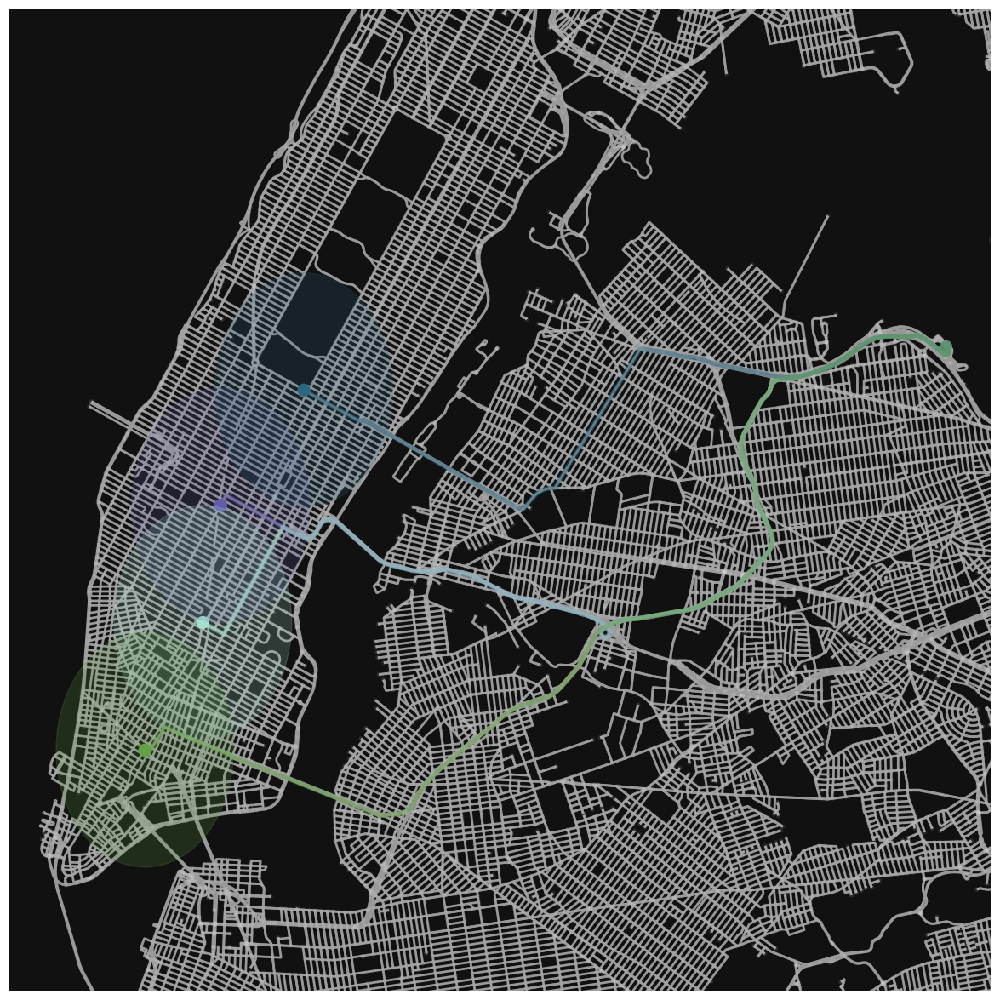

,stop_id,d,covered_stops,covered_demand
2,42430304,59.717779,"[42439972, 9140654137, 42430304, 42430329, 424...",453.964421
9,42428493,29.602880,"[42428493, 42430233, 42435598, 42430271, 42430...",184.225284
18,4347534767,16.584103,"[42430352, 42449961, 42447020, 42431549, 42436...",234.207422
24,5706569898,12.447148,"[42453952, 42457319, 5706569898, 42430126, 424...",140.031455


In [31]:
p_model = parallel_route_models[best_alpha_p]
output_data_p = p_model.build_route_parameters()
p_model.plot_route()

stop_ids = output_data_p['Stops'][:-1]
demand_vector_route_only = demand_vector.reset_index()
demand_vector_route_only = demand_vector_route_only.rename(
    columns={
        'index':'stop_id'
    }
)

demand_vector_route_only = demand_vector_route_only.loc[demand_vector_route_only['stop_id'].isin(stop_ids)]
demand_vector_route_only['covered_stops'] = \
demand_vector_route_only['stop_id'].apply(lambda id: list(search_nearby_nodes(id, distances_update, 1500).astype(int)))
demand_vector_route_only['covered_demand'] = \
demand_vector_route_only['covered_stops'].apply(lambda l: demand_vector.loc[l]['d'].sum())
demand_vector_route_only

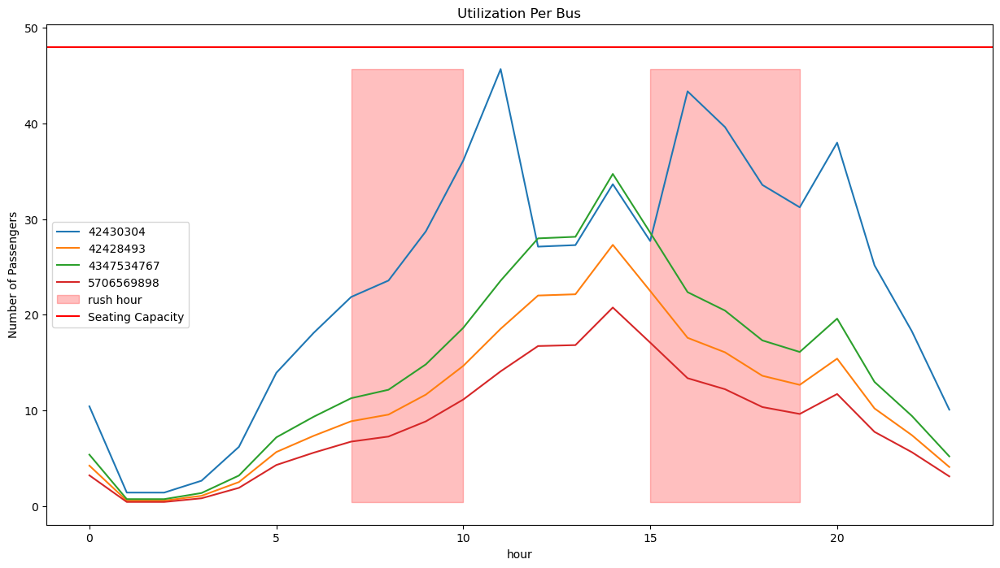

In [33]:
C = 48
demand_per_hr = [d*by_hr*1.5 for d in demand_vector_route_only['covered_demand']]
parallel_dm = pd.DataFrame(demand_per_hr,index=demand_vector_route_only['stop_id']).T 
parallel_headways = parallel_dm.div(C).apply(np.ceil) 
parallel_util = parallel_dm / parallel_headways
#parallel_util.plot()
#plt.show()
fig,ax=plt.subplots()
parallel_util.plot(
    title='Utilization Per Bus',
    figsize=(15,8), 
    ylabel='Number of Passengers',
    ax=ax
)

t = parallel_util.index
rush_hr = np.append(np.arange(7,11),np.arange(15,20))
min_y=parallel_util.min().min()
max_y=parallel_util.max().max()

ax.fill_between(
    t, 
    min_y, 
    max_y, 
    where=np.isin(t,rush_hr), 
    alpha=0.25, 
    color='red', 
    label='rush hour'
)

#assume capacity is set at 48
plt.axhline(C, color='red', label='Seating Capacity')

plt.legend()
plt.show()

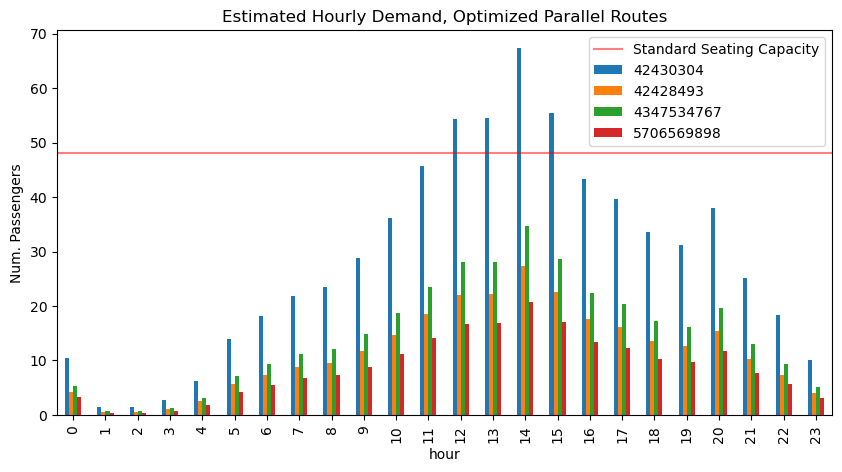

In [61]:
parallel_dm.plot(kind='bar', figsize=(10,5), title='Estimated Hourly Demand, Optimized Parallel Routes')
plt.axhline(48, label='Standard Seating Capacity', alpha=0.5, color='red')
plt.ylabel('Num. Passengers')
plt.legend()
plt.show()

In [71]:
60 / parallel_headways

stop_id,42430304,42428493,4347534767,5706569898
hour,,,,
0,60.0,60.0,60.0,60.0
1,60.0,60.0,60.0,60.0
2,60.0,60.0,60.0,60.0
3,60.0,60.0,60.0,60.0
4,60.0,60.0,60.0,60.0
5,60.0,60.0,60.0,60.0
6,60.0,60.0,60.0,60.0
7,60.0,60.0,60.0,60.0
8,60.0,60.0,60.0,60.0


##### Scenario B

In [49]:
output_data = sequential_route_models[best_alpha_seq].build_route_parameters()
#demand_vector = get_demand_parameters()
#distances_update = get_cost_matrix(weight_type = 'distance')

stop_ids = [float(i.split('_')[0]) for i in output_data['Coverage Optimized Route']]
demand_vector_route_only = demand_vector.reset_index()
demand_vector_route_only = demand_vector_route_only.rename(
    columns={
        'index':'stop_id'
    }
)

demand_vector_route_only = demand_vector_route_only.loc[demand_vector_route_only['stop_id'].isin(stop_ids)]
demand_vector_route_only['covered_stops'] = \
demand_vector_route_only['stop_id'].apply(lambda id: list(search_nearby_nodes(id, distances_update, 1500).astype(int)))
demand_vector_route_only['covered_demand'] = \
demand_vector_route_only['covered_stops'].apply(lambda l: demand_vector.loc[l]['d'].sum())
demand_vector_route_only

*** SUMMARY STATISTICS ***
Demand Covered: 0.8519333246917801
Total System Time: 22.758883992417047
Average User System Time: 16.27875475369968
Upper Bound User Time in System: 22.758883992417047 min
Lower Bound User Time in System: 3.513603656332221 min


,stop_id,d,covered_stops,covered_demand
2,42430304,59.717779,"[42439972, 9140654137, 42430304, 42430329, 424...",453.964421
7,42453952,35.278861,"[42453952, 42440287, 5706569898, 42430126, 912...",107.497106
11,42430233,23.447858,"[42428493, 42430233, 42435598, 42430271, 42430...",159.861126
46,42428368,4.786590,"[42453952, 42440287, 588546891, 279151954, 424...",75.271610


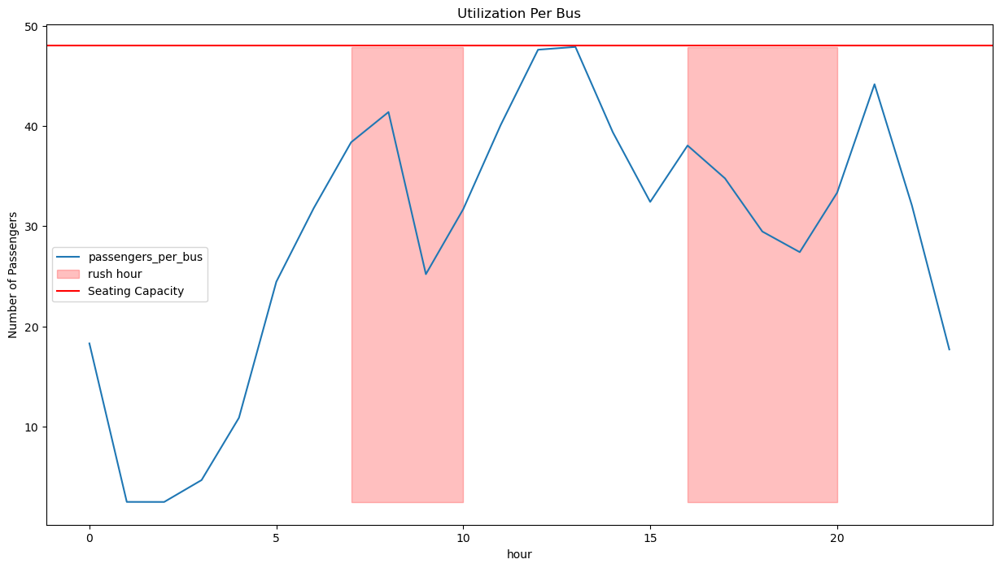

In [75]:
C = 48
demand_per_hr = sum([d*by_hr*1.5 for d in demand_vector_route_only['covered_demand']])
seq_headways = pd.DataFrame(demand_per_hr) 
seq_headways.columns = ['passenger_arrivals (lambda)']
seq_headways['bus_arrivals (mu)'] =  np.ceil(demand_per_hr / C) 
seq_headways['headways'] = 60/seq_headways['bus_arrivals (mu)']
seq_headways['passengers_per_bus'] = seq_headways['passenger_arrivals (lambda)']/seq_headways['bus_arrivals (mu)']

fig,ax=plt.subplots()
seq_headways[[
   'passengers_per_bus'
]].plot(
    title='Utilization Per Bus',
    figsize=(15,8), 
    ylabel='Number of Passengers',
    ax=ax
)

t = seq_headways.index
rush_hr = np.append(np.arange(7,11),np.arange(16,21))
min_y=seq_headways['passengers_per_bus'].min()
max_y=seq_headways['passengers_per_bus'].max()

ax.fill_between(
    t, 
    min_y, 
    max_y, 
    where=np.isin(t,rush_hr), 
    alpha=0.25, 
    color='red', 
    label='rush hour'
)

#assume capacity is set at 48
plt.axhline(C, color='red', label='Seating Capacity')

plt.legend()
plt.show()

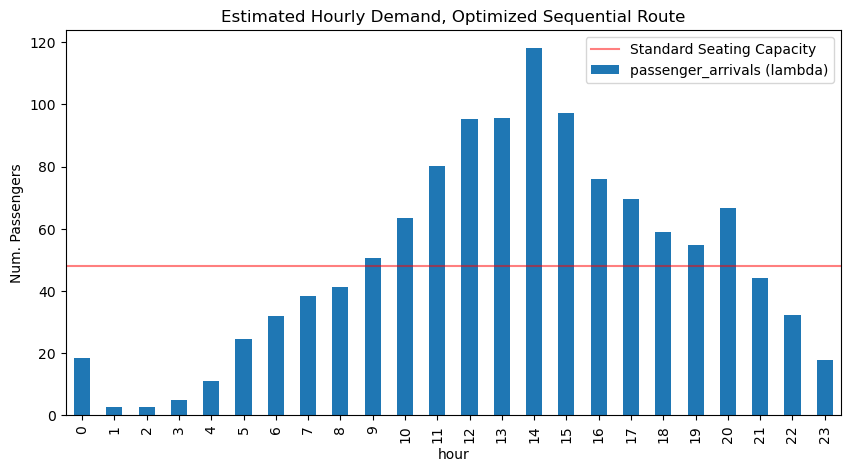

In [77]:
seq_headways[['passenger_arrivals (lambda)']].plot(kind='bar', figsize=(10,5), title='Estimated Hourly Demand, Optimized Sequential Route')
plt.axhline(48, label='Standard Seating Capacity', alpha=0.5, color='red')
plt.ylabel('Num. Passengers')
plt.legend()
plt.show()

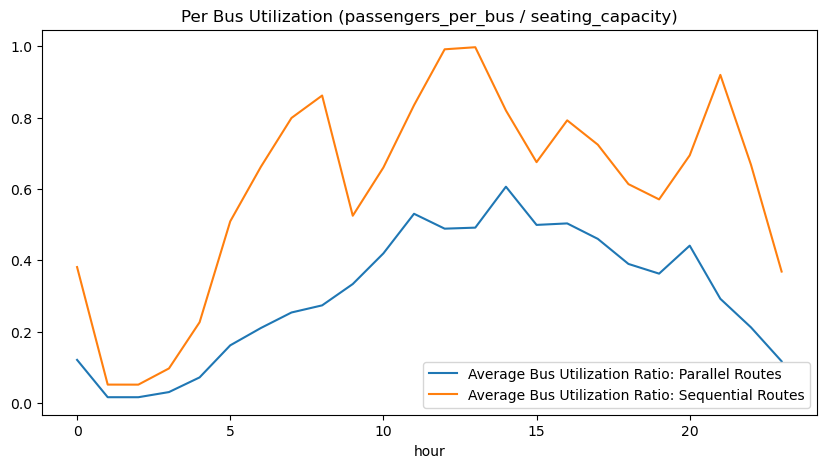

In [103]:
plt.rcParams['figure.figsize'] = (10,5)
(parallel_util.mean(axis=1) / C).plot(label='Average Bus Utilization Ratio: Parallel Routes')
(seq_headways['passengers_per_bus'] / C).plot(label='Average Bus Utilization Ratio: Sequential Routes')
plt.title('Per Bus Utilization (passengers_per_bus / seating_capacity)')
plt.legend()
plt.show()

In [107]:
(parallel_util.max(axis=1) / C).max()

0.951612694947643

In [109]:
(seq_headways['passengers_per_bus'] / C).max()


0.9973999402523687